In [1]:
import os
filename = "/root/.kaggle/"
os.makedirs(os.path.dirname(filename), exist_ok=True)

In [2]:
!cp '/content/drive/MyDrive/Colab Notebooks/kaggle_api/kaggle.json' "/root/.kaggle"

In [3]:
!kaggle datasets download -d splcher/animefacedataset

 99% 390M/395M [00:04<00:00, 99.7MB/s]
100% 395M/395M [00:04<00:00, 84.4MB/s]


In [4]:
!unzip animefacedataset.zip -d /content/animeset/

Streaming output truncated to the last 5000 lines.
  inflating: /content/animeset/images/62764_2019.jpg  
  inflating: /content/animeset/images/62765_2019.jpg  
  inflating: /content/animeset/images/62766_2019.jpg  
  inflating: /content/animeset/images/62767_2019.jpg  
  inflating: /content/animeset/images/62768_2019.jpg  
  inflating: /content/animeset/images/62769_2019.jpg  
  inflating: /content/animeset/images/6276_2003.jpg  
  inflating: /content/animeset/images/62770_2019.jpg  
  inflating: /content/animeset/images/62771_2019.jpg  
  inflating: /content/animeset/images/62772_2019.jpg  
  inflating: /content/animeset/images/62773_2019.jpg  
  inflating: /content/animeset/images/62774_2019.jpg  
  inflating: /content/animeset/images/62775_2019.jpg  
  inflating: /content/animeset/images/62776_2019.jpg  
  inflating: /content/animeset/images/62777_2019.jpg  
  inflating: /content/animeset/images/62778_2019.jpg  
  inflating: /content/animeset/images/62779_2019.jpg  
  inflating: /c

In [5]:
import tensorflow
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import deque

In [6]:
from tensorflow.keras.layers import Dense,Flatten,Dropout,BatchNormalization,LeakyReLU,Conv2DTranspose,Input,Reshape,Conv2D,ReLU
from tensorflow.keras.layers import Reshape,Activation,UpSampling2D,MaxPool2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [7]:
from sklearn.utils import shuffle
import glob

In [8]:
np.random.seed(177013)

In [9]:
def gen_normal(noise_shape):
    
    kernel_init = 'glorot_uniform'
    
    gen_input = Input(shape = noise_shape)
    generator = Conv2DTranspose(filters = 512, kernel_size = (4,4), strides = (1,1), padding = "valid", data_format = "channels_last", kernel_initializer = kernel_init)(gen_input)
    generator = BatchNormalization(momentum = 0.5)(generator)
    generator = LeakyReLU(0.2)(generator)
        
    generator = Conv2DTranspose(filters = 256, kernel_size = (4,4), strides = (2,2), padding = "same", data_format = "channels_last", kernel_initializer = kernel_init)(generator)
    generator = BatchNormalization(momentum = 0.5)(generator)
    generator = LeakyReLU(0.2)(generator)
    
    generator = Conv2DTranspose(filters = 128, kernel_size = (4,4), strides = (2,2), padding = "same", data_format = "channels_last", kernel_initializer = kernel_init)(generator)
    generator = BatchNormalization(momentum = 0.5)(generator)
    generator = LeakyReLU(0.2)(generator)
    
    generator = Conv2DTranspose(filters = 64, kernel_size = (4,4), strides = (2,2), padding = "same", data_format = "channels_last", kernel_initializer = kernel_init)(generator)
    generator = BatchNormalization(momentum = 0.5)(generator)
    generator = LeakyReLU(0.2)(generator)
    
    generator = Conv2D(filters = 64, kernel_size = (3,3), strides = (1,1), padding = "same", data_format = "channels_last", kernel_initializer = kernel_init)(generator)
    generator = BatchNormalization(momentum = 0.5)(generator)
    generator = LeakyReLU(0.2)(generator)
    
    generator = Conv2DTranspose(filters = 3, kernel_size = (4,4), strides = (2,2), padding = "same", data_format = "channels_last", kernel_initializer = kernel_init)(generator)
    generator = Activation('tanh')(generator)
        
    gen_opt = Adam(lr=0.00015, beta_1=0.5)
    generator_model = Model(gen_input,generator,name = "Generator")
    generator_model.compile(loss='binary_crossentropy', optimizer=gen_opt, metrics=['accuracy'])

    return generator_model

In [10]:
def dis_normal(image_shape=(64,64,3)):
    
    dropout_prob = 0.4
    kernel_init = 'glorot_uniform'
    dis_input = Input(shape = image_shape)
    discriminator = Conv2D(filters = 64, kernel_size = (4,4), strides = (2,2), padding = "same", data_format = "channels_last", kernel_initializer = kernel_init)(dis_input)
    discriminator = LeakyReLU(0.2)(discriminator)
    discriminator = Conv2D(filters = 128, kernel_size = (4,4), strides = (2,2), padding = "same", data_format = "channels_last", kernel_initializer = kernel_init)(discriminator)
    discriminator = BatchNormalization(momentum = 0.5)(discriminator)
    discriminator = LeakyReLU(0.2)(discriminator)
   
    discriminator = Conv2D(filters = 256, kernel_size = (4,4), strides = (2,2), padding = "same", data_format = "channels_last", kernel_initializer = kernel_init)(discriminator)
    discriminator = BatchNormalization(momentum = 0.5)(discriminator)
    discriminator = LeakyReLU(0.2)(discriminator)
    
    discriminator = Conv2D(filters = 512, kernel_size = (4,4), strides = (2,2), padding = "same", data_format = "channels_last", kernel_initializer = kernel_init)(discriminator)
    discriminator = BatchNormalization(momentum = 0.5)(discriminator)
    discriminator = LeakyReLU(0.2)(discriminator)
    
    discriminator = Flatten()(discriminator)
    
    discriminator = Dense(1)(discriminator)
    discriminator = Activation('sigmoid')(discriminator)
    #also try the SGD optimiser, might work better for a few learning rates.
    dis_opt = Adam(lr=0.0002, beta_1=0.5)
    discriminator_model = Model(dis_input,discriminator,name = "Discriminator")
    discriminator_model.compile(loss='binary_crossentropy', optimizer=dis_opt, metrics=['accuracy'])
    return discriminator_model

In [11]:
def norm_img(img):
    img = (img / 127.5) - 1
    #image normalisation to keep values between -1 and 1 for stability
    return img

def denorm_img(img):
    #for output
    img = (img + 1) * 127.5
    return img.astype(np.uint8) 

In [12]:
def sample_from_dataset(batch_size, image_shape, data_dir=None, data = None):
    sample_dim = (batch_size,) + image_shape
    sample = np.empty(sample_dim, dtype=np.float32)
    all_data_dirlist = list(glob.glob(data_dir))
    sample_imgs_paths = np.random.choice(all_data_dirlist,batch_size)
    for index,img_filename in enumerate(sample_imgs_paths):
        image = Image.open(img_filename)
        image = image.resize(image_shape[:-1])
        image = image.convert('RGB')
        image = np.asarray(image)
        image = norm_img(image)
        sample[index,...] = image
    return sample

In [13]:
def gen_noise(batch_size, noise_shape):
    #input noise for the generator should follow a probability distribution, like in this case, the normal distributon.
    return np.random.normal(0, 1, size=(batch_size,)+noise_shape)

In [14]:
def generate_images(generator, save_dir):
    
    noise = gen_noise(batch_size,noise_shape)
    fake_data_X = generator.predict(noise)
    print("Displaying generated images")
    plt.figure(figsize=(4,4))
    gs1 = gridspec.GridSpec(4, 4)
    gs1.update(wspace=0, hspace=0)
    rand_indices = np.random.choice(fake_data_X.shape[0],16,replace=False)
    for i in range(16):
        #plt.subplot(4, 4, i+1)
        ax1 = plt.subplot(gs1[i])
        ax1.set_aspect('equal')
        rand_index = rand_indices[i]
        image = fake_data_X[rand_index, :,:,:]
        fig = plt.imshow(denorm_img(image))
        plt.axis('off')
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)
    plt.tight_layout()
    plt.savefig(save_dir+str(time.time())+"_GENimage.png",bbox_inches='tight',pad_inches=0)
    plt.show()

In [15]:
def save_img_batch(img_batch,img_save_dir):
    plt.figure(figsize=(4,4))
    gs1 = gridspec.GridSpec(4, 4)
    gs1.update(wspace=0, hspace=0)
    rand_indices = np.random.choice(img_batch.shape[0],16,replace=False)
    for i in range(16):
        #plt.subplot(4, 4, i+1)
        ax1 = plt.subplot(gs1[i])
        ax1.set_aspect('equal')
        rand_index = rand_indices[i]
        image = img_batch[rand_index, :,:,:]
        fig = plt.imshow(denorm_img(image))
        plt.axis('off')
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)
    plt.tight_layout()
    plt.savefig(img_save_dir,bbox_inches='tight',pad_inches=0)
    plt.show()   

In [16]:
!mkdir /content/gan_images/
!mkdir /content/checkpoints/

In [17]:
noise_shape = (1,1,100)
num_steps = 50000
batch_size = 64
image_shape = None
img_save_dir = "/content/gan_images/"
save_model = True
image_shape = (64,64,3)
data_dir =  "/content/animeset/images/*"
log_dir = img_save_dir
save_model_dir = "/content/checkpoints/"

In [18]:
discriminator = dis_normal(image_shape)
generator = gen_normal(noise_shape)

In [19]:
discriminator.trainable = False

opt = Adam(lr=0.00015, beta_1=0.5) 
gen_inp = Input(shape=noise_shape)
GAN_inp = generator(gen_inp)
GAN_opt = discriminator(GAN_inp)
gan = Model(gen_inp,GAN_opt)
gan.compile(loss = 'binary_crossentropy', optimizer = opt, metrics=['accuracy'])

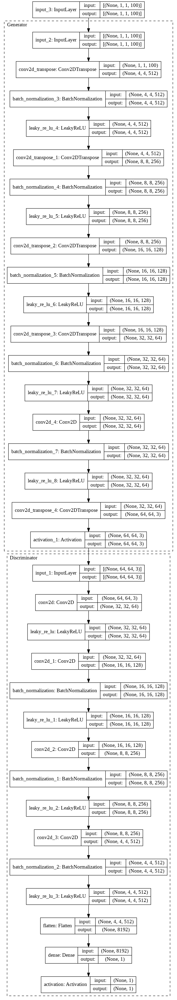

In [20]:
tensorflow.keras.utils.plot_model(gan,show_shapes = True,expand_nested=True)

In [21]:
avg_disc_fake_loss = deque([0], maxlen=250)     
avg_disc_real_loss = deque([0], maxlen=250)
avg_GAN_loss = deque([0], maxlen=250)

In [22]:
import time
from PIL import Image
import matplotlib.gridspec as gridspec

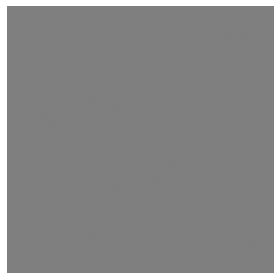

Epoch : 0/50000  D-loss-Fake : 3.260009765625 D-loss :0.5493797659873962 G-loss : 0.8088330626487732 time_taken : 8 secs
Epoch : 500/50000  D-loss-Fake : 0.3306812345981598 D-loss :0.32389482855796814 G-loss : 0.3251374363899231 time_taken : 0 secs


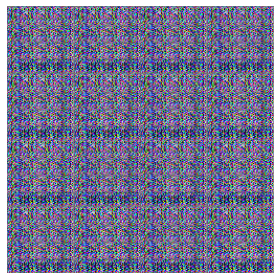

Epoch : 1000/50000  D-loss-Fake : 0.3107275664806366 D-loss :0.31186580657958984 G-loss : 0.32246631383895874 time_taken : 0 secs
Epoch : 1500/50000  D-loss-Fake : 0.34583792090415955 D-loss :0.3189968764781952 G-loss : 0.32624727487564087 time_taken : 0 secs


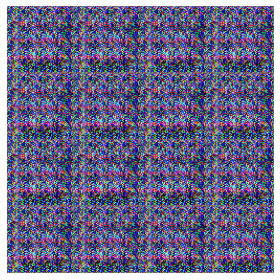

Epoch : 2000/50000  D-loss-Fake : 0.3070465326309204 D-loss :0.3161037862300873 G-loss : 0.37681955099105835 time_taken : 0 secs
Epoch : 2500/50000  D-loss-Fake : 0.32327699661254883 D-loss :0.33116626739501953 G-loss : 0.33288198709487915 time_taken : 0 secs


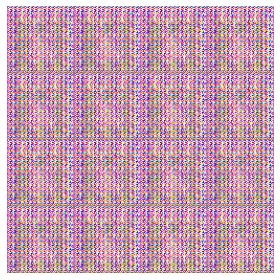

Epoch : 3000/50000  D-loss-Fake : 0.3030726909637451 D-loss :0.34078896045684814 G-loss : 0.3387455344200134 time_taken : 0 secs
Epoch : 3500/50000  D-loss-Fake : 0.35137104988098145 D-loss :0.3236687183380127 G-loss : 0.32304760813713074 time_taken : 0 secs


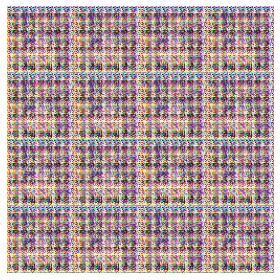

Epoch : 4000/50000  D-loss-Fake : 0.33033543825149536 D-loss :0.3085263967514038 G-loss : 0.3119159936904907 time_taken : 0 secs
Epoch : 4500/50000  D-loss-Fake : 0.30768096446990967 D-loss :0.3418896496295929 G-loss : 0.3435421586036682 time_taken : 0 secs


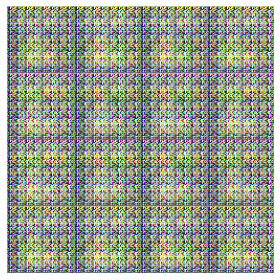

Epoch : 5000/50000  D-loss-Fake : 0.3228583335876465 D-loss :0.3567531108856201 G-loss : 0.3470578193664551 time_taken : 0 secs
Epoch : 5500/50000  D-loss-Fake : 0.30380821228027344 D-loss :0.33090776205062866 G-loss : 0.3227628469467163 time_taken : 0 secs


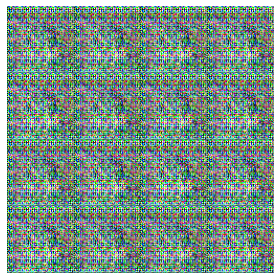

Epoch : 6000/50000  D-loss-Fake : 0.34975188970565796 D-loss :0.3338371813297272 G-loss : 0.3962825834751129 time_taken : 0 secs
Epoch : 6500/50000  D-loss-Fake : 0.32620808482170105 D-loss :0.3223228454589844 G-loss : 0.3707074522972107 time_taken : 0 secs


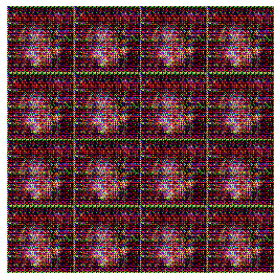

Epoch : 7000/50000  D-loss-Fake : 0.3177259564399719 D-loss :0.32479429244995117 G-loss : 0.34441888332366943 time_taken : 0 secs
Epoch : 7500/50000  D-loss-Fake : 0.3479357063770294 D-loss :0.3201909363269806 G-loss : 0.37633365392684937 time_taken : 0 secs


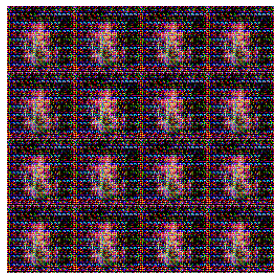

Epoch : 8000/50000  D-loss-Fake : 0.33242881298065186 D-loss :0.33587363362312317 G-loss : 0.4126177728176117 time_taken : 1 secs
Epoch : 8500/50000  D-loss-Fake : 0.365084171295166 D-loss :0.3260975182056427 G-loss : 0.3870253562927246 time_taken : 0 secs


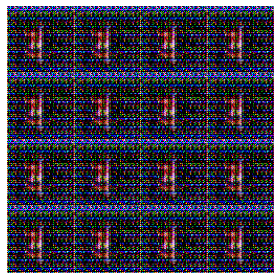

Epoch : 9000/50000  D-loss-Fake : 0.31191083788871765 D-loss :0.32620954513549805 G-loss : 0.43974238634109497 time_taken : 1 secs
Epoch : 9500/50000  D-loss-Fake : 0.3133639693260193 D-loss :0.3286319971084595 G-loss : 0.44390296936035156 time_taken : 0 secs
-----------------------------------------------------------------
Average Disc_fake loss: 0.329523
Average Disc_real loss: 0.327430
Average GAN loss: 0.441021
-----------------------------------------------------------------


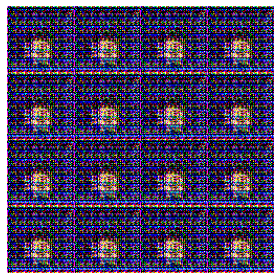

Epoch : 10000/50000  D-loss-Fake : 0.31625810265541077 D-loss :0.3222936987876892 G-loss : 0.43921154737472534 time_taken : 1 secs
Epoch : 10500/50000  D-loss-Fake : 0.34629786014556885 D-loss :0.3113224506378174 G-loss : 0.4109065532684326 time_taken : 0 secs


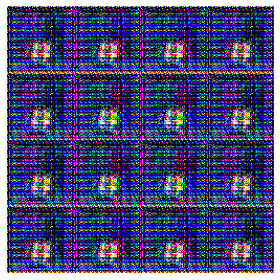

Epoch : 11000/50000  D-loss-Fake : 0.34505143761634827 D-loss :0.3275148570537567 G-loss : 0.42861849069595337 time_taken : 0 secs
Epoch : 11500/50000  D-loss-Fake : 0.32151350378990173 D-loss :0.31975260376930237 G-loss : 0.3483668565750122 time_taken : 0 secs


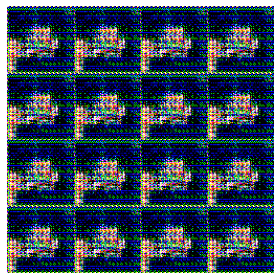

Epoch : 12000/50000  D-loss-Fake : 0.32827913761138916 D-loss :0.33425000309944153 G-loss : 0.34380465745925903 time_taken : 1 secs
Epoch : 12500/50000  D-loss-Fake : 0.3287544250488281 D-loss :0.3539838194847107 G-loss : 0.40342217683792114 time_taken : 0 secs


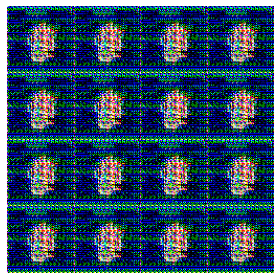

Epoch : 13000/50000  D-loss-Fake : 0.3317938446998596 D-loss :0.3379819989204407 G-loss : 0.3941688537597656 time_taken : 1 secs
Epoch : 13500/50000  D-loss-Fake : 0.33796927332878113 D-loss :0.32099586725234985 G-loss : 0.37908676266670227 time_taken : 0 secs


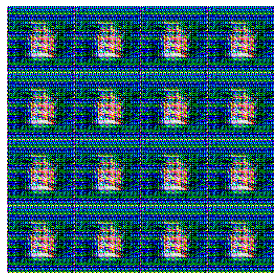

Epoch : 14000/50000  D-loss-Fake : 0.3081780672073364 D-loss :0.32416072487831116 G-loss : 0.4485929012298584 time_taken : 0 secs
Epoch : 14500/50000  D-loss-Fake : 0.338900089263916 D-loss :0.35911864042282104 G-loss : 0.4252173900604248 time_taken : 0 secs


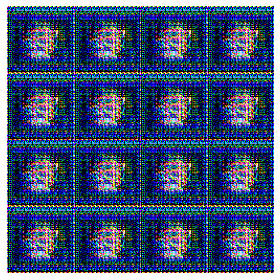

Epoch : 15000/50000  D-loss-Fake : 0.32349124550819397 D-loss :0.3293195366859436 G-loss : 0.43137887120246887 time_taken : 0 secs
Epoch : 15500/50000  D-loss-Fake : 0.3361724615097046 D-loss :0.34278297424316406 G-loss : 0.4061165750026703 time_taken : 0 secs


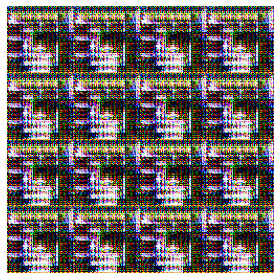

Epoch : 16000/50000  D-loss-Fake : 0.32586944103240967 D-loss :0.3462979793548584 G-loss : 0.3618178069591522 time_taken : 0 secs
Epoch : 16500/50000  D-loss-Fake : 0.3152521252632141 D-loss :0.33166614174842834 G-loss : 0.45258814096450806 time_taken : 0 secs


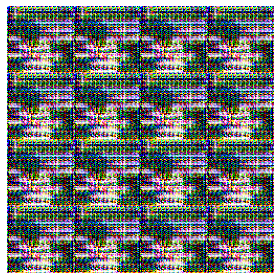

Epoch : 17000/50000  D-loss-Fake : 0.3064018487930298 D-loss :0.3360469937324524 G-loss : 0.4217342734336853 time_taken : 1 secs
Epoch : 17500/50000  D-loss-Fake : 0.35669225454330444 D-loss :0.3215824365615845 G-loss : 0.3945960998535156 time_taken : 0 secs


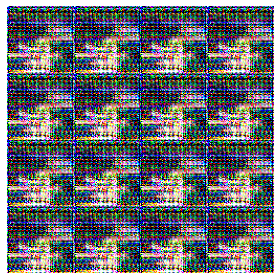

Epoch : 18000/50000  D-loss-Fake : 0.3122450113296509 D-loss :0.3317297399044037 G-loss : 0.4502623677253723 time_taken : 0 secs
Epoch : 18500/50000  D-loss-Fake : 0.33518174290657043 D-loss :0.3419262766838074 G-loss : 0.45397159457206726 time_taken : 0 secs


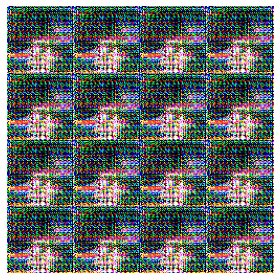

Epoch : 19000/50000  D-loss-Fake : 0.32858288288116455 D-loss :0.3390684425830841 G-loss : 0.45473235845565796 time_taken : 1 secs
Epoch : 19500/50000  D-loss-Fake : 0.3367990255355835 D-loss :0.33036068081855774 G-loss : 0.4727945923805237 time_taken : 0 secs
-----------------------------------------------------------------
Average Disc_fake loss: 0.325678
Average Disc_real loss: 0.327160
Average GAN loss: 0.465046
-----------------------------------------------------------------


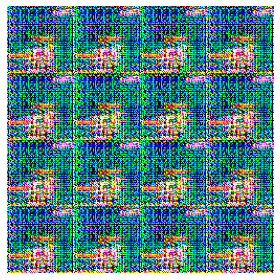

Epoch : 20000/50000  D-loss-Fake : 0.28770026564598083 D-loss :0.30733346939086914 G-loss : 0.4748747646808624 time_taken : 1 secs
Epoch : 20500/50000  D-loss-Fake : 0.3572266101837158 D-loss :0.34312254190444946 G-loss : 0.34207963943481445 time_taken : 0 secs


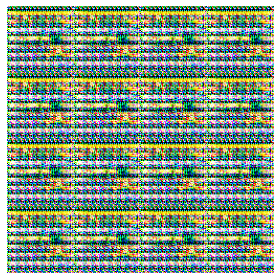

Epoch : 21000/50000  D-loss-Fake : 0.35387754440307617 D-loss :0.34100937843322754 G-loss : 0.34535807371139526 time_taken : 0 secs
Epoch : 21500/50000  D-loss-Fake : 0.2850804328918457 D-loss :0.31284672021865845 G-loss : 0.3735683262348175 time_taken : 0 secs


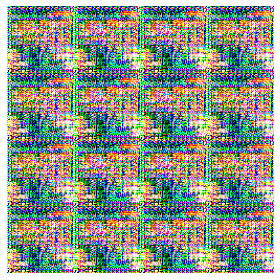

Epoch : 22000/50000  D-loss-Fake : 0.3174462914466858 D-loss :0.3130573630332947 G-loss : 0.3828471601009369 time_taken : 0 secs
Epoch : 22500/50000  D-loss-Fake : 0.32098424434661865 D-loss :0.30666497349739075 G-loss : 0.4083781838417053 time_taken : 0 secs


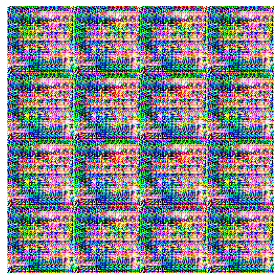

Epoch : 23000/50000  D-loss-Fake : 0.33634692430496216 D-loss :0.3214348554611206 G-loss : 0.4209130108356476 time_taken : 0 secs
Epoch : 23500/50000  D-loss-Fake : 0.34229373931884766 D-loss :0.3239940404891968 G-loss : 0.4061112403869629 time_taken : 0 secs


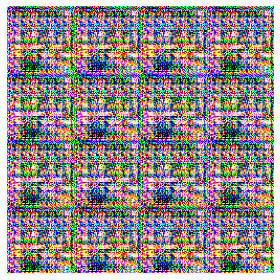

Epoch : 24000/50000  D-loss-Fake : 0.3203513026237488 D-loss :0.32356470823287964 G-loss : 0.4430411458015442 time_taken : 0 secs
Epoch : 24500/50000  D-loss-Fake : 0.3048864006996155 D-loss :0.3172193169593811 G-loss : 0.47185149788856506 time_taken : 0 secs


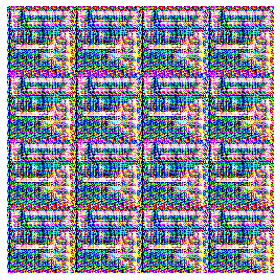

Epoch : 25000/50000  D-loss-Fake : 0.3356223702430725 D-loss :0.3388669490814209 G-loss : 0.45399045944213867 time_taken : 0 secs
Epoch : 25500/50000  D-loss-Fake : 0.3250923752784729 D-loss :0.30254310369491577 G-loss : 0.40838438272476196 time_taken : 0 secs


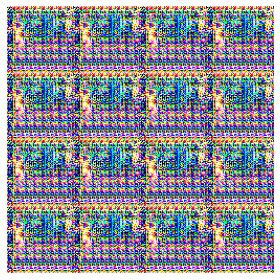

Epoch : 26000/50000  D-loss-Fake : 0.322396844625473 D-loss :0.31400859355926514 G-loss : 0.3682329058647156 time_taken : 0 secs
Epoch : 26500/50000  D-loss-Fake : 0.30907878279685974 D-loss :0.3377922475337982 G-loss : 0.43897199630737305 time_taken : 0 secs


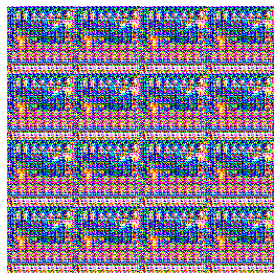

Epoch : 27000/50000  D-loss-Fake : 0.3205561637878418 D-loss :0.31481608748435974 G-loss : 0.4121262729167938 time_taken : 0 secs
Epoch : 27500/50000  D-loss-Fake : 0.3293541669845581 D-loss :0.34015148878097534 G-loss : 0.4249689280986786 time_taken : 0 secs


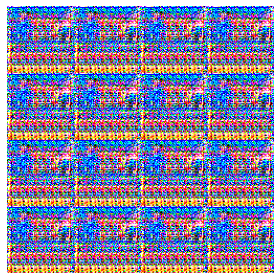

Epoch : 28000/50000  D-loss-Fake : 0.3223762512207031 D-loss :0.3440662920475006 G-loss : 0.40495190024375916 time_taken : 0 secs
Epoch : 28500/50000  D-loss-Fake : 0.3113664388656616 D-loss :0.3370450437068939 G-loss : 0.3764915466308594 time_taken : 0 secs


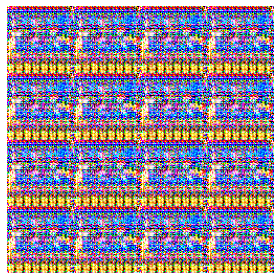

Epoch : 29000/50000  D-loss-Fake : 0.3276520371437073 D-loss :0.34239473938941956 G-loss : 0.41154778003692627 time_taken : 1 secs
Epoch : 29500/50000  D-loss-Fake : 0.31851649284362793 D-loss :0.33299362659454346 G-loss : 0.4002872109413147 time_taken : 0 secs
-----------------------------------------------------------------
Average Disc_fake loss: 0.326159
Average Disc_real loss: 0.325918
Average GAN loss: 0.397273
-----------------------------------------------------------------


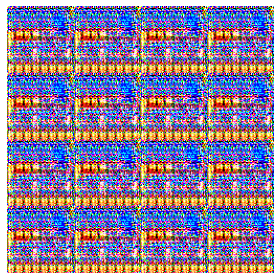

Epoch : 30000/50000  D-loss-Fake : 0.3398635983467102 D-loss :0.31399965286254883 G-loss : 0.39438527822494507 time_taken : 1 secs
Epoch : 30500/50000  D-loss-Fake : 0.315596342086792 D-loss :0.3483046591281891 G-loss : 0.43705156445503235 time_taken : 0 secs


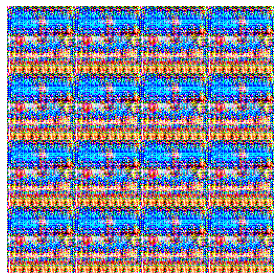

Epoch : 31000/50000  D-loss-Fake : 0.2873280942440033 D-loss :0.33653733134269714 G-loss : 0.41778117418289185 time_taken : 0 secs
Epoch : 31500/50000  D-loss-Fake : 0.32892197370529175 D-loss :0.28064024448394775 G-loss : 0.3758017420768738 time_taken : 0 secs


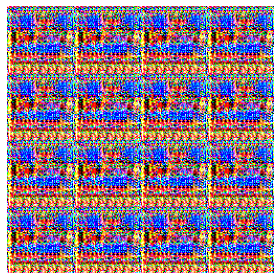

Epoch : 32000/50000  D-loss-Fake : 0.31872451305389404 D-loss :0.3006867468357086 G-loss : 0.37172752618789673 time_taken : 0 secs
Epoch : 32500/50000  D-loss-Fake : 0.3312319219112396 D-loss :0.3680518567562103 G-loss : 0.440329372882843 time_taken : 0 secs


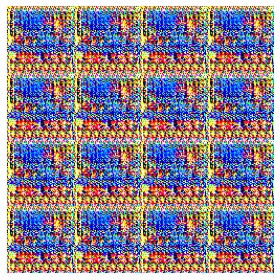

Epoch : 33000/50000  D-loss-Fake : 0.3093695640563965 D-loss :0.3225719630718231 G-loss : 0.41471320390701294 time_taken : 0 secs
Epoch : 33500/50000  D-loss-Fake : 0.316676527261734 D-loss :0.29962095618247986 G-loss : 0.37140917778015137 time_taken : 0 secs


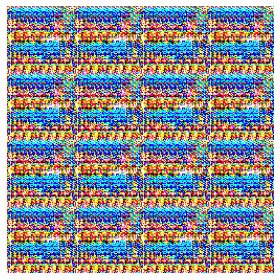

Epoch : 34000/50000  D-loss-Fake : 0.3401854932308197 D-loss :0.3332616984844208 G-loss : 0.39560583233833313 time_taken : 0 secs
Epoch : 34500/50000  D-loss-Fake : 0.2980820834636688 D-loss :0.30812937021255493 G-loss : 0.3856581449508667 time_taken : 0 secs


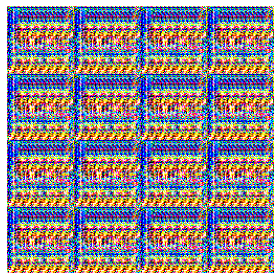

Epoch : 35000/50000  D-loss-Fake : 0.31741029024124146 D-loss :0.3203853964805603 G-loss : 0.3822547197341919 time_taken : 0 secs
Epoch : 35500/50000  D-loss-Fake : 0.33974575996398926 D-loss :0.30395761132240295 G-loss : 0.3580392897129059 time_taken : 0 secs


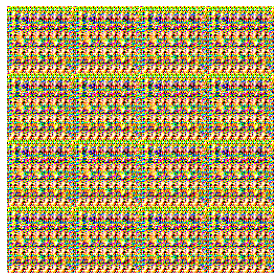

Epoch : 36000/50000  D-loss-Fake : 0.35957878828048706 D-loss :0.33494362235069275 G-loss : 0.37082648277282715 time_taken : 0 secs
Epoch : 36500/50000  D-loss-Fake : 0.29276174306869507 D-loss :0.3698599338531494 G-loss : 0.41483980417251587 time_taken : 0 secs


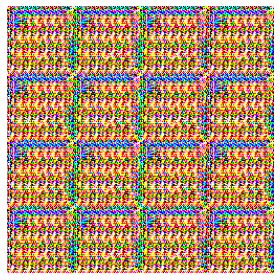

Epoch : 37000/50000  D-loss-Fake : 0.3247690796852112 D-loss :0.33178600668907166 G-loss : 0.4009796977043152 time_taken : 0 secs
Epoch : 37500/50000  D-loss-Fake : 0.31535017490386963 D-loss :0.3449789583683014 G-loss : 0.4020442068576813 time_taken : 0 secs


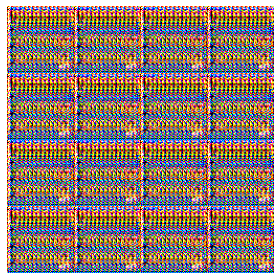

Epoch : 38000/50000  D-loss-Fake : 0.3303062915802002 D-loss :0.3590118885040283 G-loss : 0.41073715686798096 time_taken : 0 secs
Epoch : 38500/50000  D-loss-Fake : 0.32339468598365784 D-loss :0.3095337748527527 G-loss : 0.3553078770637512 time_taken : 0 secs


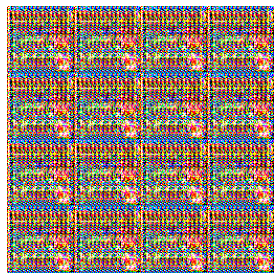

Epoch : 39000/50000  D-loss-Fake : 0.3294607400894165 D-loss :0.3075879216194153 G-loss : 0.3507212996482849 time_taken : 0 secs
Epoch : 39500/50000  D-loss-Fake : 0.3126973509788513 D-loss :0.34320423007011414 G-loss : 0.3933427929878235 time_taken : 0 secs
-----------------------------------------------------------------
Average Disc_fake loss: 0.324001
Average Disc_real loss: 0.326866
Average GAN loss: 0.381870
-----------------------------------------------------------------


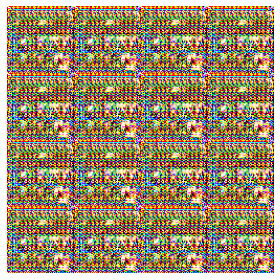

Epoch : 40000/50000  D-loss-Fake : 0.30792027711868286 D-loss :0.3283393085002899 G-loss : 0.40464264154434204 time_taken : 1 secs
Epoch : 40500/50000  D-loss-Fake : 0.3195977807044983 D-loss :0.3261287808418274 G-loss : 0.3839920461177826 time_taken : 0 secs


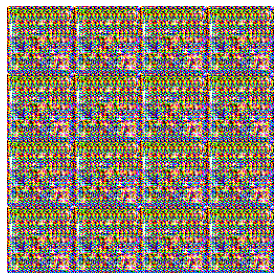

Epoch : 41000/50000  D-loss-Fake : 0.3208635449409485 D-loss :0.3492787182331085 G-loss : 0.38940757513046265 time_taken : 0 secs
Epoch : 41500/50000  D-loss-Fake : 0.33008235692977905 D-loss :0.33395278453826904 G-loss : 0.39905714988708496 time_taken : 0 secs


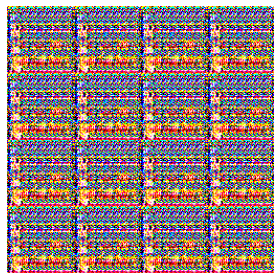

Epoch : 42000/50000  D-loss-Fake : 0.36632975935935974 D-loss :0.31005650758743286 G-loss : 0.3564046025276184 time_taken : 0 secs
Epoch : 42500/50000  D-loss-Fake : 0.33628201484680176 D-loss :0.3013155460357666 G-loss : 0.35942041873931885 time_taken : 0 secs


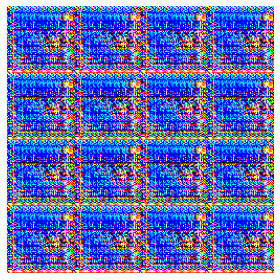

Epoch : 43000/50000  D-loss-Fake : 0.33341315388679504 D-loss :0.3324713706970215 G-loss : 0.3571600914001465 time_taken : 1 secs


In [ ]:
for step in range(num_steps): 
    tot_step = step
    step_begin_time = time.time() 
    
    real_data_X = sample_from_dataset(batch_size, image_shape, data_dir = data_dir)

    noise = gen_noise(batch_size,noise_shape)
    
    fake_data_X = generator.predict(noise)
    
    if tot_step % 1000 == 0:
        step_num = str(tot_step).zfill(4)
        save_img_batch(fake_data_X,img_save_dir+step_num+".png")

    #concatenate real and fake data samples    
    data_X = np.concatenate([real_data_X,fake_data_X])
    #add noise to the label inputs
    real_data_Y = np.ones(batch_size) - np.random.random_sample(batch_size)*0.2
    
    
    fake_data_Y = np.random.random_sample(batch_size)*0.2
     
    data_Y = np.concatenate((real_data_Y,fake_data_Y))
        
    discriminator.trainable = True
    generator.trainable = False
    #training the discriminator on real and fake data can be done together, i.e., 
    #on the data_x and data_y, OR it can be done 
    #one by one as performed below. This is the safer choice and gives better results 
    #as compared to combining the real and generated samples.
    dis_metrics_real = discriminator.train_on_batch(real_data_X,real_data_Y)  
    dis_metrics_fake = discriminator.train_on_batch(fake_data_X,fake_data_Y)   
    
    
    
    avg_disc_fake_loss.append(dis_metrics_fake[0])
    avg_disc_real_loss.append(dis_metrics_real[0])
    
    generator.trainable = True

    GAN_X = gen_noise(batch_size,noise_shape)

    GAN_Y = real_data_Y
    
    discriminator.trainable = False
    
    gan_metrics = gan.train_on_batch(GAN_X,GAN_Y) 
    avg_GAN_loss.append(gan_metrics[0])
    
    
    end_time = time.time()
    diff_time = int(end_time - step_begin_time)
    if tot_step % 500 == 0:
        print(f"Epoch : {tot_step}/{num_steps}  D-loss-Fake : {dis_metrics_fake[0]} D-loss :{dis_metrics_real[0]} G-loss : {gan_metrics[0]} time_taken : {diff_time} secs")
    
    if ((tot_step+1) % 10000) == 0:
        print("-----------------------------------------------------------------")
        print("Average Disc_fake loss: %f" % (np.mean(avg_disc_fake_loss)))    
        print("Average Disc_real loss: %f" % (np.mean(avg_disc_real_loss)))    
        print("Average GAN loss: %f" % (np.mean(avg_GAN_loss)))
        print("-----------------------------------------------------------------")
        discriminator.trainable = True
        generator.trainable = True
        generator.save(save_model_dir+str(tot_step)+"_GENERATOR_weights_and_arch.hdf5")
        discriminator.save(save_model_dir+str(tot_step)+"_DISCRIMINATOR_weights_and_arch.hdf5")